In [1]:
import math
import random
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.collections import PatchCollection
from scipy.spatial.distance import cdist

# PART I: Blue-noise Sampler

## Naive Book Code

Start with a method that could not possibly fail.  

For this problem, that means the DART method.  
Just start picking points at random, and if they're not too close to any previous points, add it to a list.  
This emulates throwing darts at the wall and seeing if they stick to it or fall off (if the fletchings overlap or something).

[The book](https://www.labri.fr/perso/nrougier/from-python-to-numpy/#blue-noise-sampling) just gives you naive code that should work.  
As more points are added, the available space for new points should decrease and the number of attempts between successful appends should go up.  
It stops when the number of attempts between succesful appends is over some amount `k`.  
The book does this (I believe) because it makes for a better comparison later with Bridson's algorithm. 

For my version, I modified it to go until it adds exactly `N` points.  
This is because:
1. I think it's easier to tune run parameters by final density than wait time, and
2. The ultimate run time is more conveniently expressed by the number of points.
   
Downside is that now I actually have to be careful about how many points I tell the code to add (should probably have guardrails for that).  
Too high, and it might run infinitely, i.e. there are no more valid spots. 

**Pseudocode:**
1. Initialize an empty list, `points`, to hold the sampled points.
1. Initialize (at 0) a tracking number `last_success` for the amount of succesful appends to the list. 
1. Do (indefinitely) in a `while`-loop:
    1. Pick a candidate point randomly.
    1. Check if its distance to any of the ones already in `points` is below a cutoff radius `r` (default $0.025$).  
    3. If the distance to all other points is above `r`, append it to `points` and increment `last_success` by $1$.
    4. Break if `last_success` is larger than `N` (default $700$ for the unit box and default`r`).

In [2]:
# modified book code

def DART_sampling(w=1.0, h=1.0, r=0.025, N=700):
    def distance(p0, p1):
        dx, dy = p0[0]-p1[0], p0[1]-p1[1]
        return math.hypot(dx, dy)

    points = []
    last_success = 0
    while True:
        x = random.uniform(0, w)
        y = random.uniform(0, h)
        accept = True
        for p in points:
            if distance(p, (x, y)) < r:
                accept = False
                break
        if accept is True:
            points.append((x, y))
            if last_success == N-1:
                break
            last_success += 1
            
    return np.array(points)

%time sample = DART_sampling()

CPU times: user 204 ms, sys: 428 ms, total: 633 ms
Wall time: 139 ms


## Testing Blue Noise Samplers

Rule number 1 of the internet: never blindly believe things written on it.  
So just because it *says* the naive code works doesn't mean it *actually* works - test it yourself.   
With this in mind, you should think about *how* to test the code.  
There are 2 general methods I though of: visual inspection, and math.  

The first is straightforward enough, we know what the distribution should look like so we might as well plot it.  
We need to check that even at high densities, none of the points are within `r` of each other.  
For this, I borrowed code from the [Scipy documentation](https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.qmc.PoissonDisk.html#r440c442183ee-2).  
**Note:** You could also just use the Scipy Poisson disk sampler if you weren't doing this for practice.  
It's the same thing, but with a different name. 

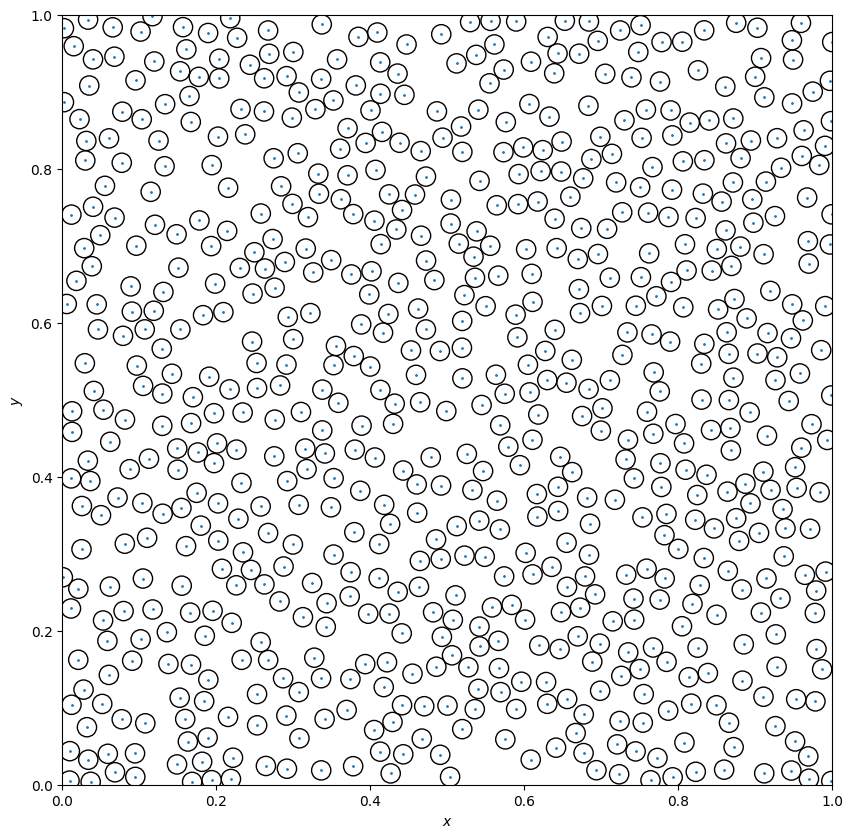

In [3]:
# Scatter plot with disk radii for visual inspection
# Adapted from Scipy documentation

def scatter_sample(sample, r=0.025, fsize=10, xmin=0, xmax=1, ymin = 0, ymax = 1):
    """Scatter plot noise + marker circles for exclusion radii"""
    fig, ax = plt.subplots(figsize = (fsize, fsize))
    ax.scatter(sample[:, 0], sample[:, 1], s = 1)
    
    circles = [plt.Circle((xi, yi), radius=r/2, fill=False)
               for xi, yi in sample]
    collection = PatchCollection(circles, match_original=True)
    ax.add_collection(collection)
    
    ax.set(aspect='equal', xlabel=r'$x$', ylabel=r'$y$',
               xlim=[xmin, xmax], ylim=[xmin, xmax])
    plt.show()
    
scatter_sample(sample)

CPU times: user 1.05 s, sys: 2.16 ms, total: 1.06 s
Wall time: 953 ms


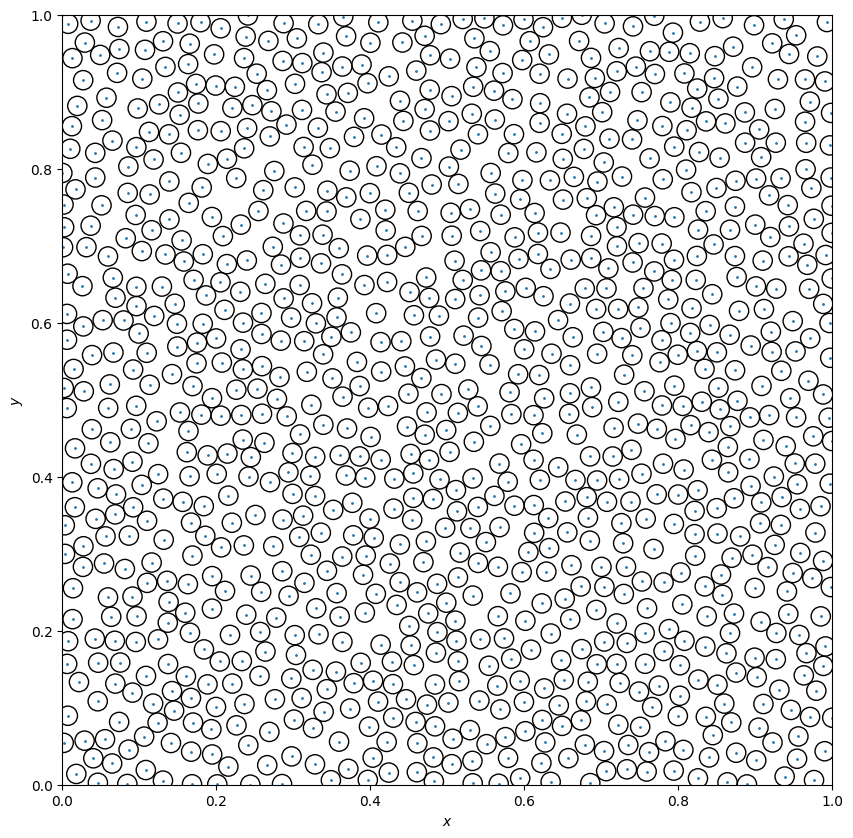

In [4]:
# Test for higher density case

%time sample = DART_sampling(w=1, h=1, r=0.025, N=1000)
scatter_sample(sample, 
               r = 0.025, 
               fsize = 10, 
               xmin = 0, 
               xmax = 1, 
               ymin = 0, 
               ymax = 1
              )

The other way to test if it worked relies on the periodogram (read: Fourier transform).   

I'm not going to explain the concept of the Fourier transform here (this notebook would be far too long if I did).  
All you need to know is that if you do it right, it should make a periodogram like Figure 1 in [Bridson's paper](https://www.cs.ubc.ca/~rbridson/docs/bridson-siggraph07-poissondisk.pdf).  
By contrast, a uniform random sampler will make a flat, "salt-and-pepper" periodogram.

**Sidenote:** While not exactly the same, it is vaguely similar to the [Airy disk](https://en.wikipedia.org/wiki/Airy_disk).  
This makes some sense, as both involve circles and shot noise. 

In [5]:
def FFT_logger(sampler, runs=100, res=12, w=1, *args, **kwargs):
    """
    Make 2d Fourier transform over multiple samples and averages them. 

    KEYWORD ARGS
    sampler: sampling function to use (takes args and kwargs)
       runs: # of samples to take for averaging the Fourier transform
        res: controls resolution via grid size=2^res in the FFT
          w: width of the image (assumes square right now)

    RETURNS
    fft_out: 2d Fourier transform averaged over # of runs.
    """
    def spec2(coords, grid_size, dom_size):
        """
        Make 2d Fourier transform for sample distribution of points.
        Coordinates are binned by histogram then FFT'd.

        KEYWORD ARGS
             coords: numpy array of 2d coordinates for the noise sample
          grid_size: size of grid for histogram of (rescaled) coords
           dom_size: extent of coordinates (>= max-min of coords)

        RETURNS
        fft2_shifted: 2d Fourier transform (complex-valued) DC shifted.
        """
    
        # Rescale original domain to a new (integer) grid
        scaled_coords = (coords/dom_size) * (grid_size-1)
        scaled_coords = scaled_coords.astype(int)
    
        # Use numpy 2d histogram, should be(?) faster than native python
        grid, _, _ = np.histogram2d(coords[:, 1],  
                                    coords[:, 0], 
                                    bins=grid_size,
                                    range=[[0, dom_size], [0, dom_size]]
                                    )
        
        # Compute Fourier transform 
        fft2 = np.fft.fft2(grid)
        fft2_shifted = np.fft.fftshift(fft2)
        
        return fft2_shifted
        
    sample = sampler(*args, **kwargs)
    fft_out = spec2(sample, 2**res, w)
    
    for i in range(1, runs):
        sample = sampler(*args, **kwargs)
        fft_out += spec2(sample, 2**res, w)
    
    fft_out *= 1/runs
    return fft_out
    

In [6]:
def plot_norm_FFT(fft, edge, vmin=0, vmax=6):
    to_plot = np.log(np.abs(fft)**2)
    to_plot -= - np.median(to_plot)
    to_plot *= 1/(np.std(to_plot))

    xmin = len(to_plot)//2-edge
    xmax = len(to_plot)//2+edge
    ymin = xmin
    ymax = xmax
    to_plot = to_plot[ymin:ymax, xmin:xmax]
    
    plt.figure(figsize = (11, 11))
    plt.imshow(to_plot, 
               vmin=vmin, 
               vmax=vmax, 
               cmap=plt.cm.Greys_r)
    #plt.colorbar()
    plt.tick_params(bottom=False,      # ticks off
                    left=False,         
                    labelbottom=False, # axis labels off
                    labelleft=False
                   ) 
    plt.show()
    

In [7]:
DART_FFT = FFT_logger(DART_sampling, 
                      w=1, 
                      h=1, 
                      r=0.025, 
                      N=1000)

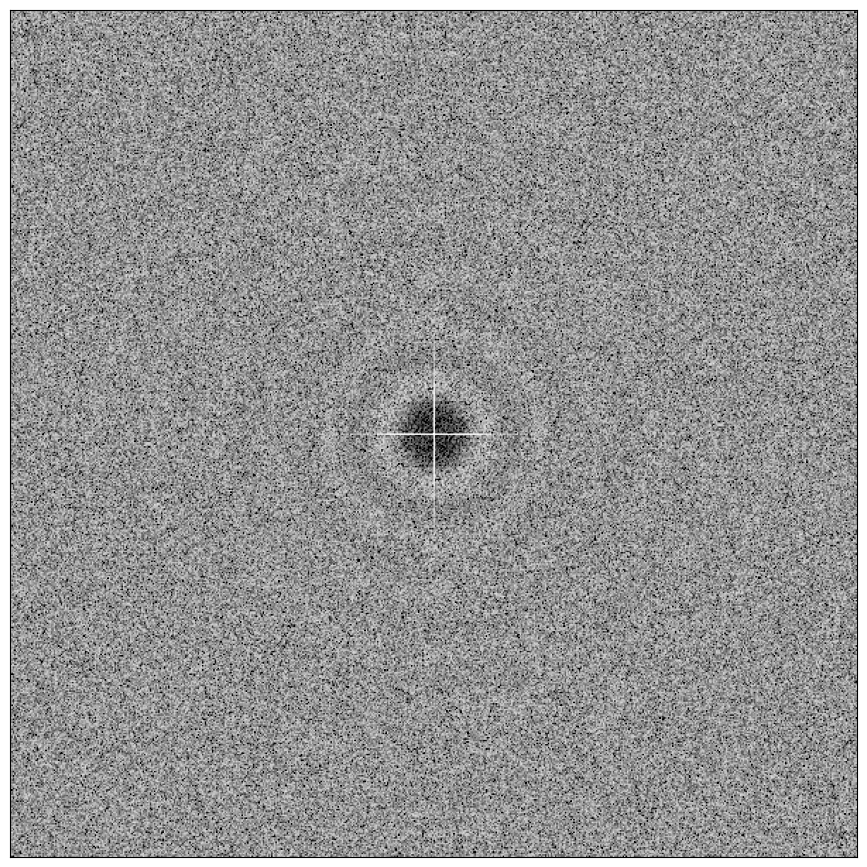

In [8]:
plot_norm_FFT(DART_FFT, 300)

CPU times: user 24.8 s, sys: 6.63 s, total: 31.4 s
Wall time: 31.7 s


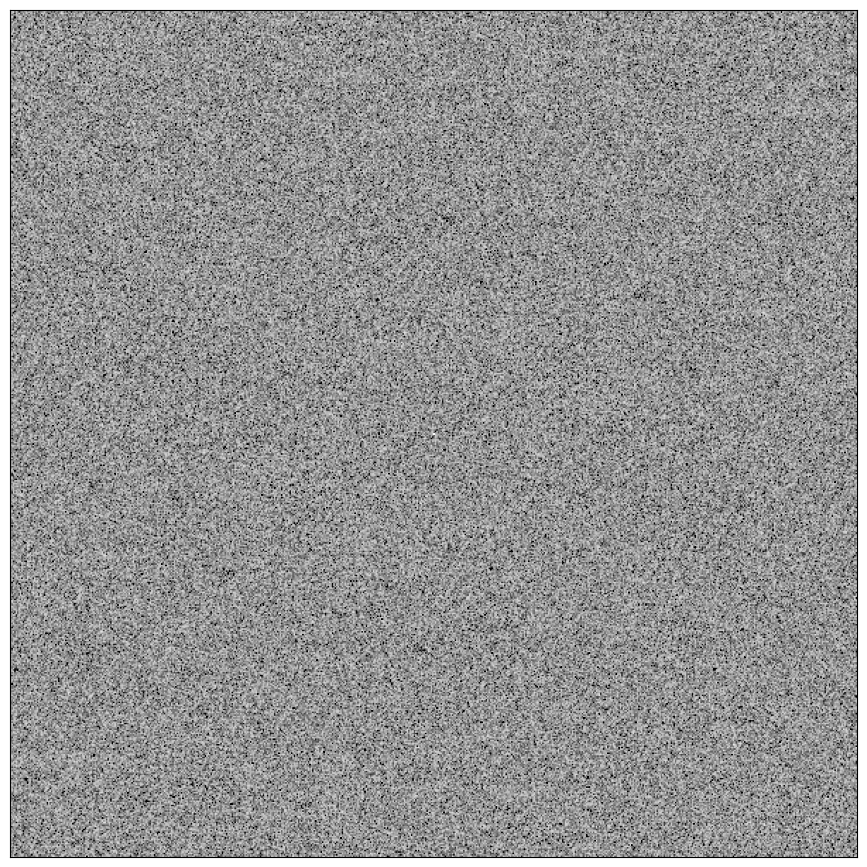

In [9]:
# Compare to uniform random sample (should be fast)
%time RAND_FFT = FFT_logger(np.random.rand, 100, 12, 1, 1000, 2) 
plot_norm_FFT(RAND_FFT, 300) 

In [10]:
# Speed test for single-shot sampling (DART vs. uniform random)

w = 1
h = 1
r = 0.025
N = 1000

print('Time (DART)')
%timeit DART_sampling(w, h, r, N)
print('\nTime (numpy random)')
%timeit w*np.random.rand(1000, 2)
print()

Time (DART)
1.17 s ± 136 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)

Time (numpy random)
6.93 µs ± 68.6 ns per loop (mean ± std. dev. of 7 runs, 100,000 loops each)



So our results agree with Bridson/theory, and the code does what it says it does.   
But as the book said, naive DART is quite slow - orders of magnitude slower than the uniform random sampler.  

It's also slow in an absolute sense - about 1 second on a $100 \times 100$ patch for my desired sampling density.  
This bodes poorly if we want to apply them to actual images of reasonable size.  
At this point we should look for speed improvements like vectorization. 

**Sidenote:** If you were wondering about the cross pattern in the periodogram, that's just an artifact because I used a grid in the FFT code.  
You can also see it in [this code](https://scipython.com/blog/power-spectra-for-blue-and-uniform-noise/) which uses classes.   

## Vectorized DART

One of the reasons our code is slow is that we check pairwise distances one by one.  
We can vectorize this, because someone conveniently made a command that just does exactly that: scipy's [cdist](https://docs.scipy.org/doc/scipy/reference/generated/scipy.spatial.distance.cdist.html). 

Knowing we can calculate distances all at once, we may as well generate the candidates all at once too.  
This means we need an idea of how many candidates we ultimately want.  
Ideally we should generate enough candidates to fill the space many times over, knowing several will be rejected by disk overlap.  

In the book, they explicitly calculate the theoretical maximum number of points given by the [circle packing problem](https://en.wikipedia.org/wiki/Circle_packing).  
They do this because they (presumably) don't want to tune the number of candidates per area.  
You *could* get away with proposing a flat number, or even some other heuristic based on area and radius.    
Just know that proposing too few will undersample the area, while too many will waste time trying to fit in points when there's no space. 

**Pseudocode:**
1. Calculate the theoretical maximum number $n$ of disks with radius $r$ that fit in the region. 
1. Generate $5n$ candidate points randomly as a numpy array.
1. Calculate the pair-wise distances as a matrix (vecotrized by `cdist`).
1. Take the first candidate point as your first accepted point, append it to `points` and its index to `indices`
1. While there are unchecked candidates and the target number of points `N` has not been reached:
    1. Choose the next candidate by index.
    1. Check if the smallest distance to any of the ones already in `points` is above cutoff radius `r` (default $0.025$).  
       If yes, append it to `points`, its index to `indices`, and increment `last_success` by $1$.

In [11]:
# modified book code

def DART_sampling_vec(w=1.0, h=1.0, r=0.025, N=700):

    # Theoretical limit
    n = int((w+r)*(h+r) / (2*(r/2)*(r/2)*np.sqrt(3))) + 1
    n = 5*n

    # Compute n random points
    P = np.zeros((n, 2))
    P[:, 0] = np.random.uniform(0, w, n)
    P[:, 1] = np.random.uniform(0, h, n)

    # Computes respective distances at once
    D = cdist(P, P)

    # Cancel null distances on the diagonal
    D[range(n), range(n)] = 1e10

    points, indices = [P[0]], [0]
    i = 1
    last_success = 1
    while i < n and last_success < N:
        if D[i, indices].min() > r:
            indices.append(i)
            points.append(P[i])
            last_success += 1
        i += 1
    return np.array(points)


In [12]:
# Speed test for single-shot sampling (vectorized vs unvectorized)
print('Not vectorized')
%timeit DART_sampling(1, 1, 0.025, 1000)
print()
print('Vectorized ')
%timeit DART_sampling_vec(1, 1, 0.025, 1000)

Not vectorized
1.14 s ± 153 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)

Vectorized 
340 ms ± 4.91 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


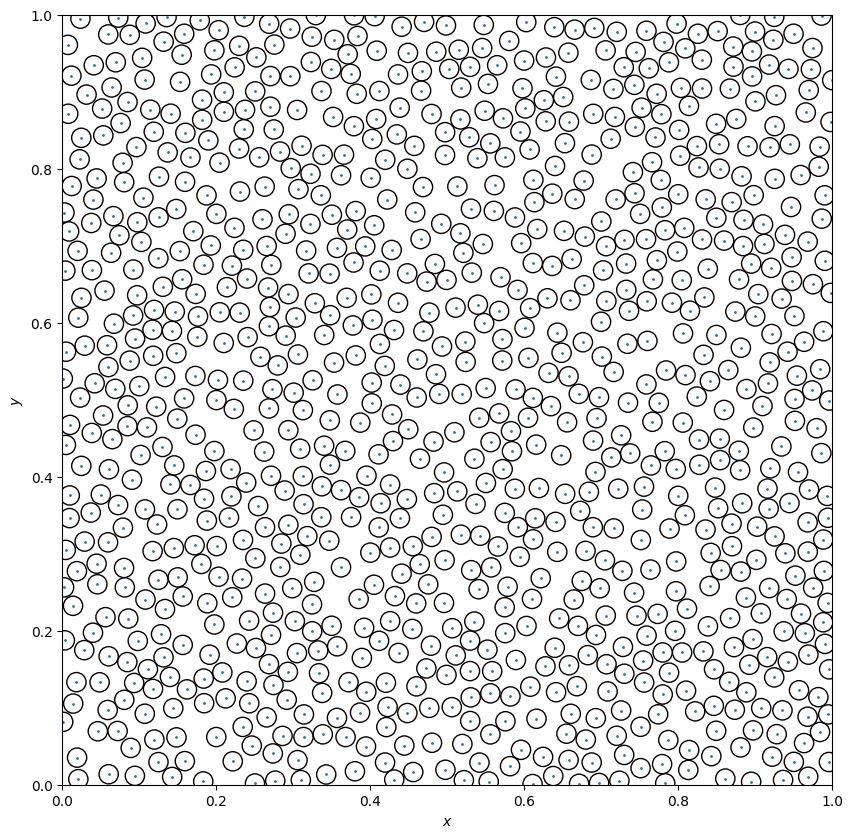

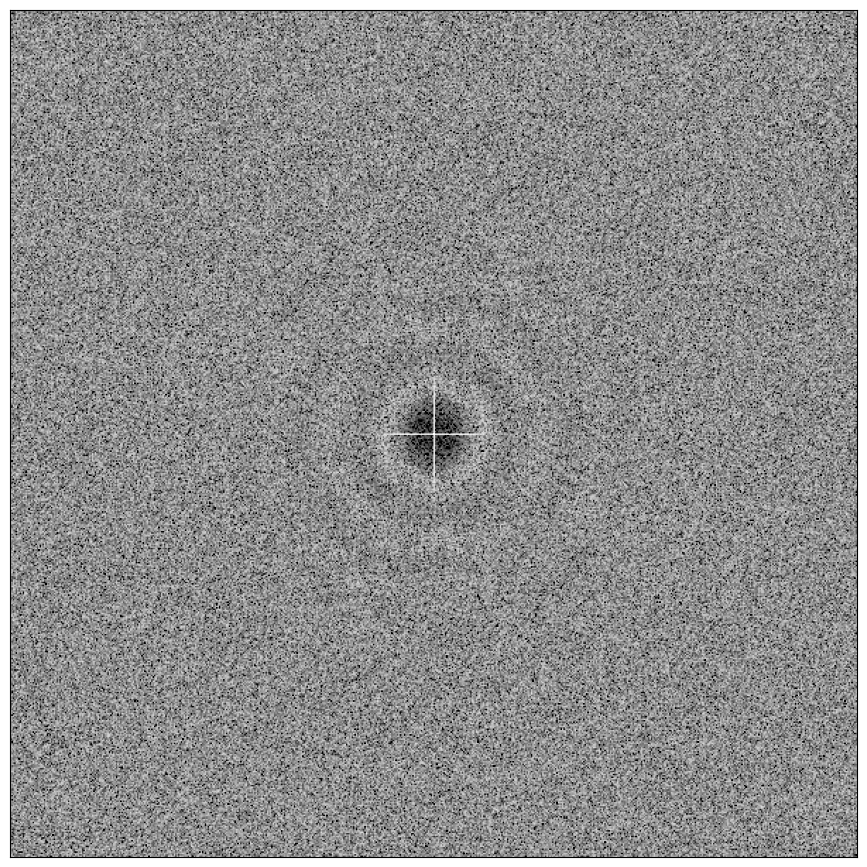

In [13]:
# Sanity checks for vectorized version 
sample_vec = DART_sampling_vec(1, 1, 0.025, 1000)
DART_FFT = FFT_logger(DART_sampling_vec, 
                      w=1,
                      h=1,
                      r=0.025,
                      N=1000
                     )

scatter_sample(sample_vec)
plot_norm_FFT(DART_FFT, 300)

## Improving Dart - Bridson's Algorithm

Vectorization definitely helped, but its still a little slow.  
This is because it always has trouble finding spots for new candidates when there are already a lot of accepted points.  
So we waste a lot of time rejecting a lot of candidates - in so many words, the method is a bit *too* random.  
If we allocate space more systematically, we could reject fewer candidates per iteration and speed up the process.   
[Bridson](https://www.cs.ubc.ca/~rbridson/docs/bridson-siggraph07-poissondisk.pdf) worked this out in 2007, and it's based on 2 ideas.  

First, we know the theoretical densest packing is hexagonally packed.  
So we can make our own square grid to represent it ([games](https://www.redblobgames.com/grids/hexagons/) usally try to do the opposite).    
As long as the spacing is appropiate, each cell in our grid contains at most one point in the densest packing.  
This lets us pre-check if there is overlap without actually doing distance calculations (i.e. cell is occupied, so the candidate will definitely hit something). 

Second, given a set of accepted points, we only want to generate candidates a certain distance from the outermost points (which I call the "frontier").  
This guarantees that the region directly touching the frontier will be well-sampled, but there is still plenty of space for further iterations.  
To make it a bit more digestible, [here](https://observablehq.com/@mbostock/poisson-disc-distribution) is a visualization of Bridson's algorithm (the frontier is in red).  

The high level operations are as follows:  
1. Initialize a $2$-d grid, where the area of each grid cell is at most $r/\sqrt{2}$.  
   Each cell of this grid holds at most one disk.
1. Initialize an empty list (the frontier) and append a randomly generated point.
1. While the frontier is not empty:
    1. Pick a node from the frontier randomly.
    1. Randomly generate up to $k$ candidates within a distance $r$ to $2r$ from the current (parent) node.  
    1. Check which candidates are at least $r$ away from all other points (and in the sampling area) and add them to the frontier.
    1. Remove the parent node from the frontier.  


In [14]:
# Book code (based on Bridson's description), modified for my terminology

def brid_sampling(w=1.0, h=1.0, r=0.025, k=30):
    """
    
    Bridson apparently suggests $k=30$, but maybe start with $k=4$ for speed.  

    Bridson's paper says only remove frontier nodes after k failed tries.
    Here, we implicitly assume k is high enough to sample the annulus well.  
    So we immediately remove the frontier node and skip having an if-block.

    Code also has a lookup table N, for speed. 
    Per grid position (i, j), stores all cells n-steps away (default n=2).
    
    """
    def squared_distance(p0, p1):
        """Euclidean distance that is faster than linalg (somehow)"""
        return (p0[0]-p1[0])**2 + (p0[1]-p1[1])**2 
        
    def random_point_around(point, k=1):
        """Generate k candidates w/ random polar coordinates (for annulus)"""
        R = np.random.uniform(r, 2*r, k)
        T = np.random.uniform(0, 2*np.pi, k)
        P = np.empty((k, 2))
        P[:, 0] = point[0]+R*np.sin(T)
        P[:, 1] = point[1]+R*np.cos(T)
        return P
    
    def neighborhood(shape, index, n=2):
        """For index=(row, col), return all cells 1 to n steps away"""
        row, col = index
        row0, row1 = max(row-n, 0), min(row+n+1, shape[0])
        col0, col1 = max(col-n, 0), min(col+n+1, shape[1])
        I = np.dstack(np.mgrid[row0:row1, col0:col1])
        I = I.reshape(I.size//2, 2).tolist()
        I.remove([row, col]) # exclude the cell itself
        return I
    
    def in_neighborhood(cand):
        """Check if a candidate IS too close to any other accepted point."""
        i, j = int(cand[0]/cellsize), int(cand[1]/cellsize)
        if accept[i, j]: 
            return True # cell already occupied
        for (i, j) in N[(i, j)]:
            if accept[i, j] and squared_distance(cand, pos[i, j]) < r_sq:
                return True
        return False
        
    def add_point(cand):
        """Add valid candidate to the frontier and set of accepted points."""
        frontier.append(cand)
        i, j = int(cand[0]/cellsize), int(cand[1]/cellsize)
        pos[i, j], accept[i, j] = cand, True

    cellsize = r/np.sqrt(2)
    rows = int(np.ceil(w/cellsize))
    cols = int(np.ceil(h/cellsize))

    r_sq = r*r
    
    pos = np.zeros((rows, cols, 2), dtype=np.float32)
    accept = np.zeros((rows, cols), dtype=bool)

    # Cache generation for neighborhood
    N = {}
    for i in range(rows):
        for j in range(cols):
            N[(i, j)] = neighborhood(accept.shape, (i, j), 2)
            
    # Steps 2-3
    frontier = [] 
    add_point((np.random.uniform(w), np.random.uniform(h)))
    while len(frontier):
        i = np.random.randint(len(frontier))
        point = frontier[i]
        del frontier[i]
        k_cands = random_point_around(point, k)
        for cand in k_cands:
            if (0<=cand[0]<w) and (0<=cand[1]<h) and not in_neighborhood(cand):
                add_point(cand)
    return pos[accept]

If you're overwhelmed by the code, I would suggest reading it bottom to top.  
The high-level operations start when initializing empty list `frontier = []`  
Everything after that is a translation of the pseudocode, and should be read as such.  
Everything before that is a supporting operation or definition that you would read as they come up in the high level operation.  

One thing the code does that is not strictly part of Bridson's algorithm is making the "neighborhood" `N`.   
This is just a list of all neighbors $n$-steps away for every cell (default `n=2`).  
If you recall the brute-force MC method for the zebra tours problem, we did the same thing by listing all valid zebra moves per square of the board.  
Both are made so that you don't have to re-find the neighbor cells every time you have a new candidate.  

In [15]:
%timeit brid_sampling()

110 ms ± 803 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)


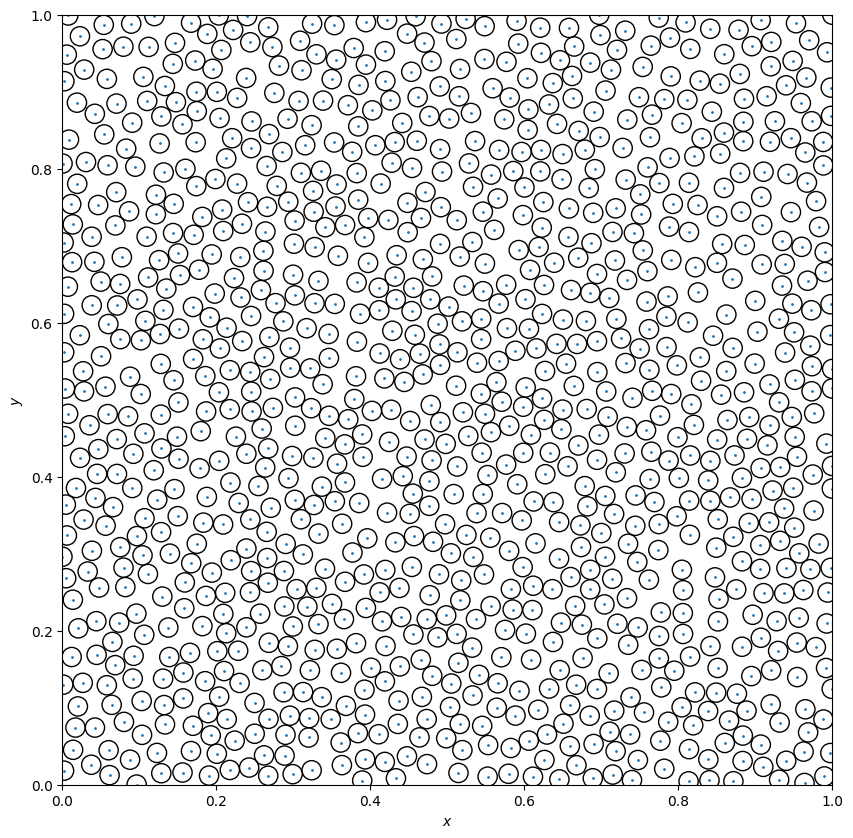

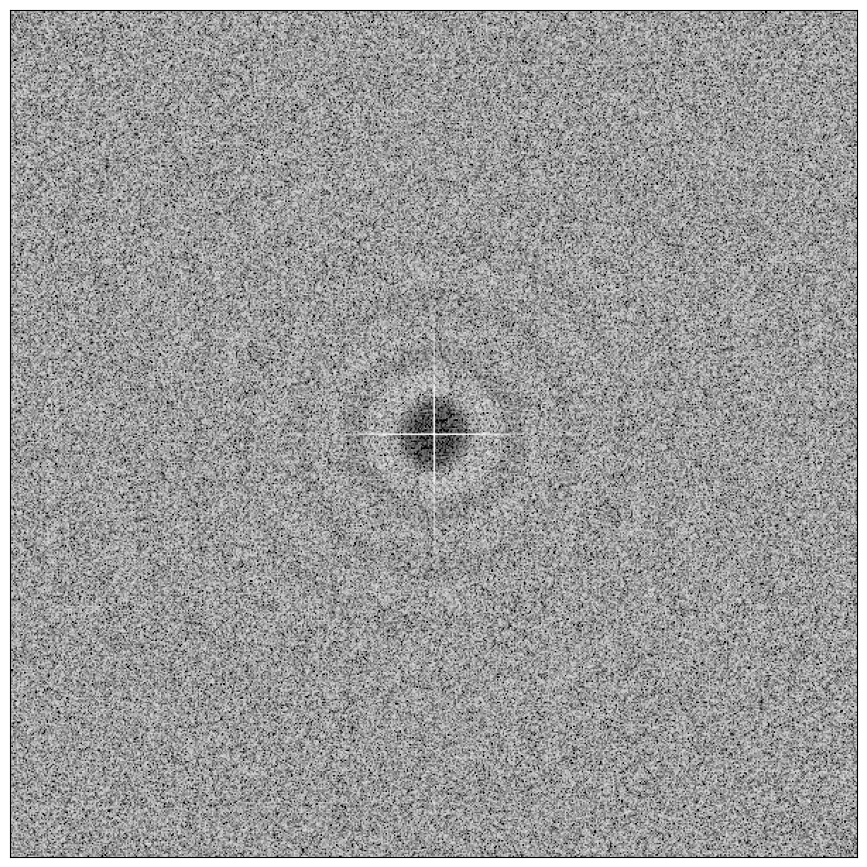

In [16]:
# Sanity checks for Bridson code
sample_brid = brid_sampling()
brid_FFT = FFT_logger(brid_sampling)

scatter_sample(sample_brid)
plot_norm_FFT(brid_FFT, 300)

## Extra: Denser Bridson

As they mention [here](https://extremelearning.com.au/an-improved-version-of-bridsons-algorithm-n-for-poisson-disc-sampling/), we actually don't need to sample the annulus uniformly.  
If we skew our selection to prefer regions closer to the inner radius, we should get a denser packing.  
In fact, we don't even need to make the proposal radius random at all.  
We can just pick a constant radius slightly larger than the disk, and make the angles random. 


In [17]:
# Bridson code again, changed in radius generator line

def brid_sampling_fast(w=1.0, h=1.0, r=0.025, k=30):
    """
    
    Bridson apparently suggests $k=30$, but maybe start with $k=4$ for speed.  

    Bridson's paper says only remove frontier nodes after k failed tries.
    Here, we implicitly assume k is high enough to sample the annulus well.  
    So we immediately remove the frontier node and skip having an if-block.

    Code also has a lookup table N, for speed. 
    Per grid position (i, j), stores all cells n-steps away (default n=2).
    
    """
    def squared_distance(p0, p1):
        """Euclidean distance that is faster than linalg (somehow)"""
        return (p0[0]-p1[0])**2 + (p0[1]-p1[1])**2 
        
    def random_point_around(point, k=1):
        """Generate k candidates w/ random polar coordinates (for annulus)"""
        R = r * (1 + 10**(-8)) ### CHANGED HERE ### 
        T = np.random.uniform(0, 2*np.pi, k)
        P = np.empty((k, 2))
        P[:, 0] = point[0]+R*np.sin(T)
        P[:, 1] = point[1]+R*np.cos(T)
        return P
    
    def neighborhood(shape, index, n=2):
        """For index=(row, col), return all cells 1 to n steps away"""
        row, col = index
        row0, row1 = max(row-n, 0), min(row+n+1, shape[0])
        col0, col1 = max(col-n, 0), min(col+n+1, shape[1])
        I = np.dstack(np.mgrid[row0:row1, col0:col1])
        I = I.reshape(I.size//2, 2).tolist()
        I.remove([row, col]) # exclude the cell itself
        return I
    
    def in_neighborhood(cand):
        """Check if a candidate IS too close to any other accepted point."""
        i, j = int(cand[0]/cellsize), int(cand[1]/cellsize)
        if accept[i, j]: 
            return True # cell already occupied
        for (i, j) in N[(i, j)]:
            if accept[i, j] and squared_distance(cand, pos[i, j]) < r_sq:
                return True
        return False
        
    def add_point(cand):
        """Add valid candidate to the frontier and set of accepted points."""
        frontier.append(cand)
        i, j = int(cand[0]/cellsize), int(cand[1]/cellsize)
        pos[i, j], accept[i, j] = cand, True

    cellsize = r/np.sqrt(2)
    rows = int(np.ceil(w/cellsize))
    cols = int(np.ceil(h/cellsize))

    r_sq = r*r
    
    pos = np.zeros((rows, cols, 2), dtype=np.float32)
    accept = np.zeros((rows, cols), dtype=bool)

    # Cache generation for neighborhood
    N = {}
    for i in range(rows):
        for j in range(cols):
            N[(i, j)] = neighborhood(accept.shape, (i, j), 2)
            
    # Steps 2-3
    frontier = [] 
    add_point((np.random.uniform(w), np.random.uniform(h)))
    while len(frontier):
        i = np.random.randint(len(frontier))
        point = frontier[i]
        del frontier[i]
        k_cands = random_point_around(point, k)
        for cand in k_cands:
            if (0<=cand[0]<w) and (0<=cand[1]<h) and not in_neighborhood(cand):
                add_point(cand)
    return pos[accept]

In [18]:
%timeit brid_sampling_fast()

86.3 ms ± 13.7 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [24]:
# Comparison of practically reachable density. 

%time sample_brid = brid_sampling(k=2**10)
print("Original Bridson samples: ", len(sample_brid))
print()
%time sample_bridF = brid_sampling_fast(k=2**10)
print("Improved Bridson samples: ", len(sample_bridF))

CPU times: user 2.45 s, sys: 6.42 ms, total: 2.45 s
Wall time: 2.46 s
Original Bridson samples:  1167

CPU times: user 2.56 s, sys: 1.44 ms, total: 2.57 s
Wall time: 2.58 s
Improved Bridson samples:  1315


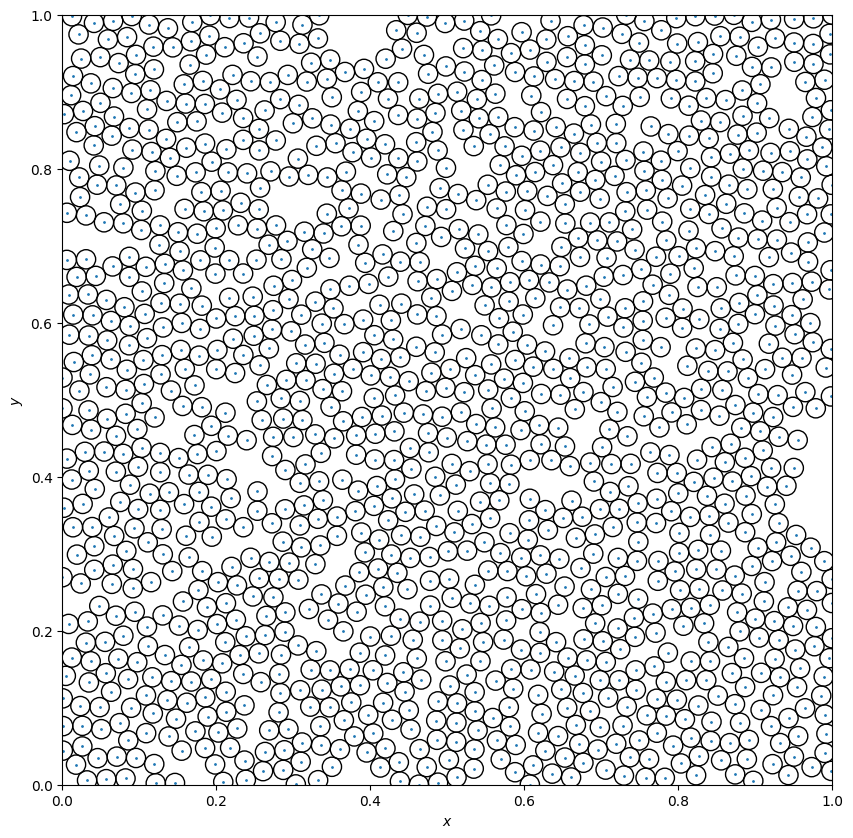

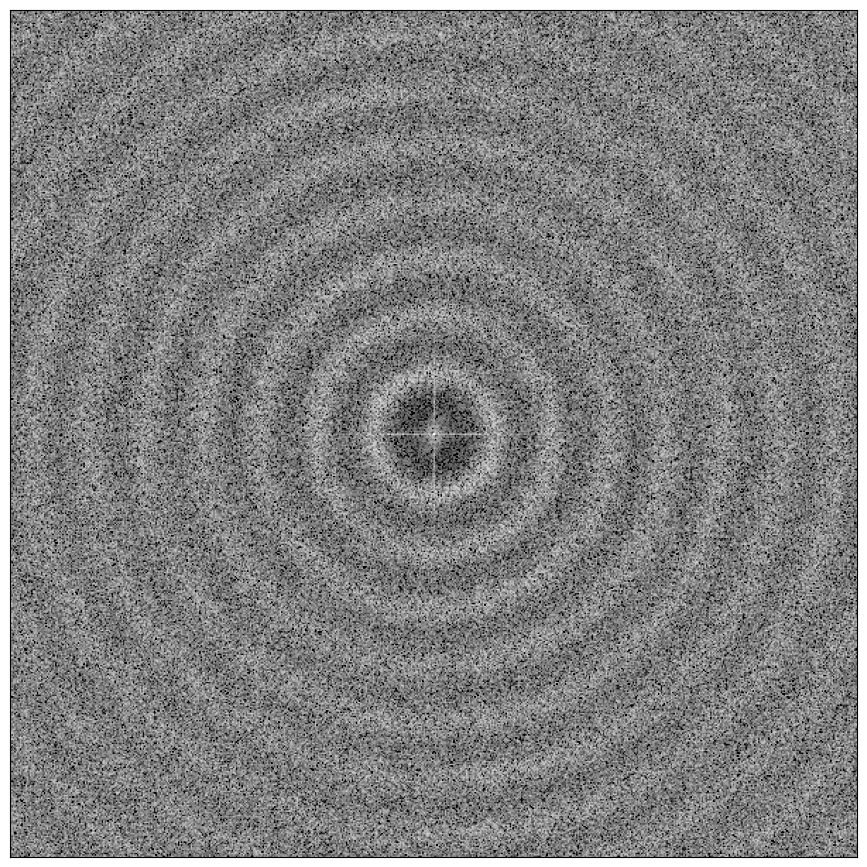

In [25]:
# Sanity checks of denser Bridson code
bridF_FFT = FFT_logger(brid_sampling_fast)

scatter_sample(sample_bridF)
plot_norm_FFT(bridF_FFT, 300)

In [26]:
# Lower disk radii (increase max density)

%time sample_brid = brid_sampling(r=0.01, k=2**10)
print("Original Bridson samples: ", len(sample_brid))
print()
%time sample_bridF = brid_sampling_fast(r=0.01, k=2**10)
print("Improved Bridson samples: ", len(sample_bridF))

CPU times: user 16 s, sys: 23.3 ms, total: 16.1 s
Wall time: 16.1 s
Original Bridson samples:  7143

CPU times: user 16.1 s, sys: 12.6 ms, total: 16.1 s
Wall time: 16.2 s
Improved Bridson samples:  8100


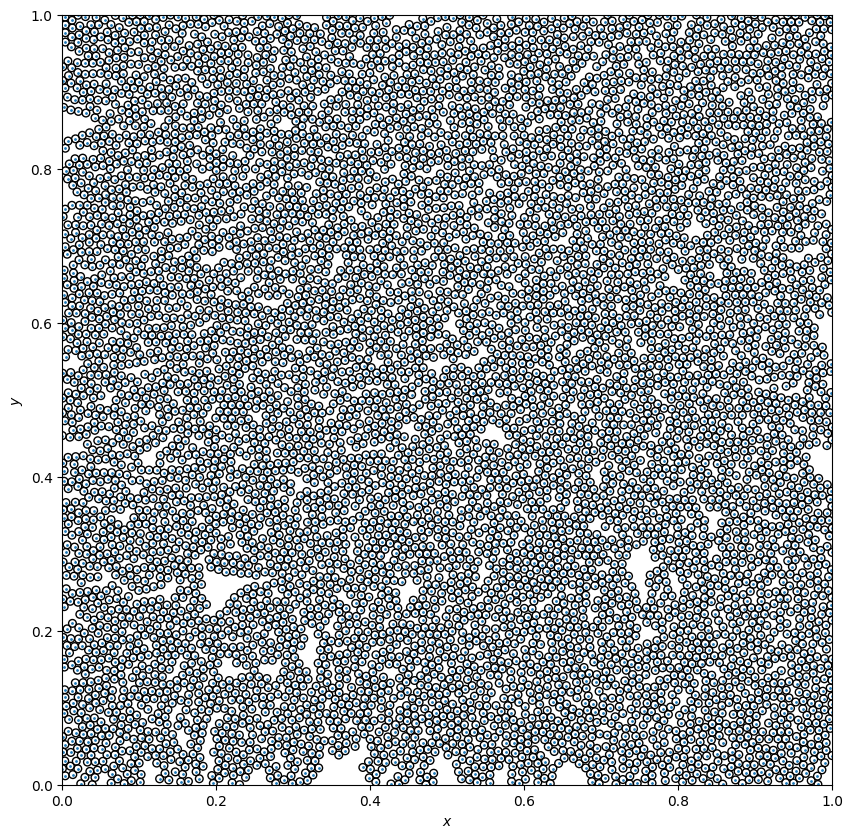

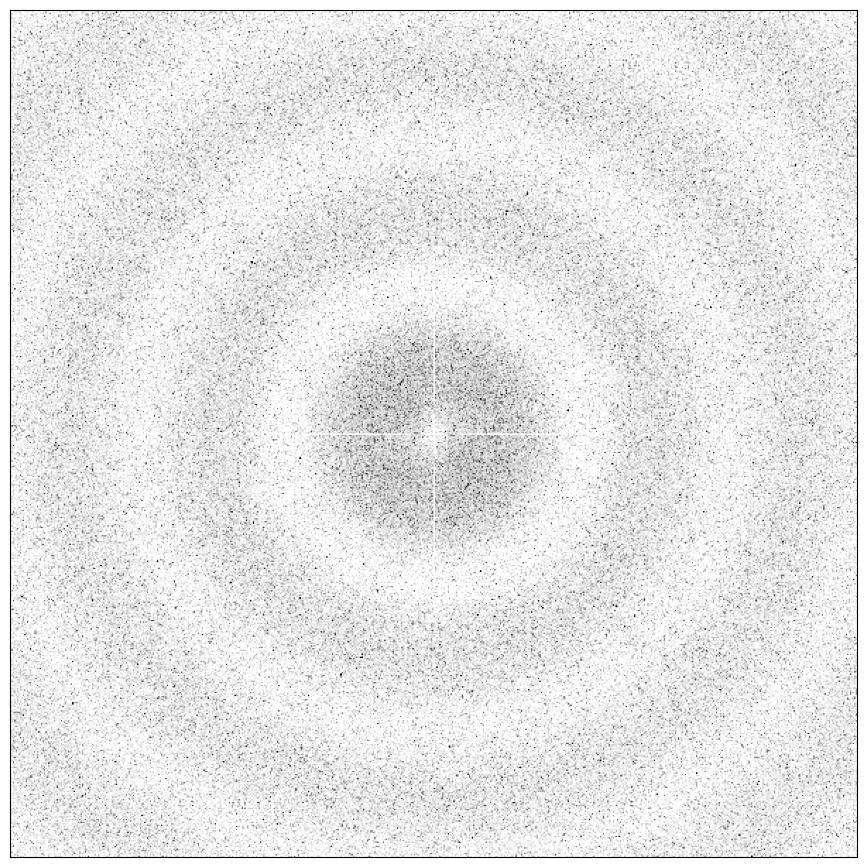

In [27]:
# Sanity checks with smaller disk radii
bridF_FFT = FFT_logger(brid_sampling_fast, r=0.01)

scatter_sample(sample_bridF, r=0.01)
plot_norm_FFT(bridF_FFT, 300)

In the code above, I made the proposal radii equal to the disk radii $\times (1+10^{-8})$, though you may want to make the offset term adjustable.  
But as you can see, the algorithm *can* make a denser packing for equal parameter settings.  
This is also reflected in the fact that the FFTs/periodograms are qualitatively similar, but with different amplitudes and widths.

The downside, at least as for the purpose of mosaics, is that the distribution of gaps between cells is now more irregular.  
You could probably fix this by either trying out a few other radii per frontier node, or increasing the offset term.    
But
1. I'm lazy.
2. Even if I get it fixed, the end result is a more *regular* arrangement of the points.  
   I think the aesthetic appeal is the (spatially homogenous) *irregularity* of the tiling.  
   In other words, I want the mosaic to look more like a [cross-section of cells](https://www.medicalgraphics.de/wp-content/uploads/2023/01/histology-cells-blue.jpg), less like [crystals with grain boundaries](https://www.the-warren.org/ALevelRevision/engineering/grainstructure.htm)

With those in mind, I'm going to stick with the original Bridson algorithm for the next phase.  

# Next: Voronoi Tessellation

